# FARS Data Story
## Introduction
This is an intial exploration of the Fatality Analysis Reporting System (FARS) dataset of traffic crash-related fatalities in the United States between 2011 and 2014.  The analysis is broken up into major sections exploring the who, when, how, and where aspects of traffic-related fatalities. The ultimate objective of this project is to provide location-specific recommendations to reduce traffic fatalities.

In [99]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import pysal as ps
import datetime
import scipy
import scipy.spatial as spatial
import seaborn as sns
import plotly.plotly as py
from plotly.graph_objs import *
from plotly import tools
from plotly.offline import iplot, init_notebook_mode

%matplotlib inline

init_notebook_mode()


## Importing data

In [2]:
accident = pd.DataFrame.from_csv('wrangled_data/accident_2011_2015.csv', index_col=None)
#vehicle = pd.DataFrame.from_csv('wrangled_data/vehicle_2011_2015.csv', index_col=None)
#person = pd.DataFrame.from_csv('wrangled_data/person_2011_2015.csv', index_col=None)
census = pd.DataFrame.from_csv('wrangled_data/census_2011_2015.csv', index_col=None)

## Part I: Where?
### Where geographically do different kinds of accidents occur? On what kinds of roads?

In [3]:
#list(accident) #list column names
accident.shape #get number of rows

(153297, 53)

In [4]:
'''
Define function to convert dates to day of year
date = date to convert
fmt = format of date
'''
def date2yday(date, fmt): 
    dt = datetime.datetime.strptime(str(date), fmt) #convert date to datetime object
    db =dt.timetuple().tm_yday
    return db

#date2yday = np.vectorize(date2yday) #this does not work

fmt = '%Y-%m-%d %H:%M:%S'

In [5]:
#base plotly, problems if run all years (will crash), figure out how to do slider to select one year at a time

accident['DATE'] = pd.to_datetime(accident[['DAY', 'MONTH', 'YEAR']])
accident['YDAY'] = accident['DATE'].apply(date2yday, fmt = fmt)

accident['POPUP'] = accident['DATE'].dt.strftime('%B %-d'
                          ) + ', ' + accident['FATALS'].astype(str) + ' Killed'

test = accident[accident['YEAR'] == 2014]

data = [dict(
        type = 'scattergeo',
        locationmode = 'USA-states',
        lon = test[test.LONGITUD < 0]['LONGITUD'],
        lat = test[test.LONGITUD < 0]['LATITUDE'],
        text = test[test.LONGITUD < 0]['POPUP'],
        mode = 'markers',
        marker = dict( 
            size = test[test.LONGITUD < 0]['FATALS'] ** 0.5 * 5,
            opacity = 0.75,
            color = 'rgb(215, 0, 0)')
        )]

layout = dict(
         title = 'United States Traffic Fatalitites 2014',
         geo = dict(
             scope = 'usa',
             projection = dict(type = 'albers usa'),
             showland = True,
             landcolor = 'rgb(250, 250, 250)',
             subunitwidth = 1,
             subunitcolor = 'rgb(217, 217, 217)',
             countrywidth = 1,
             countrycolor = 'rgb(217, 217, 217)',
             showlakes = True,
             lakecolor = 'rgb(255, 255, 255)')
         )

figure = dict(data = data, layout = layout)
iplot(figure)
#test['LATITUDE'].head()


## Part II: When?
### When are crashes most likely to occur during the day? Week? Year?

In [6]:
# traffic fatalities by day and year
traffic_day = pd.DataFrame({'FATALS': accident.groupby(['YEAR', 'YDAY'])['FATALS'].sum()}).reset_index()
#len(traffic_day)
#DataFrame({'count' : df1.groupby( [ "Name", "City"] ).size()}).reset_index()
# thirty day moving average of traffic fatalites by date
traffic_average = pd.Series(traffic_day['FATALS']).rolling(window=30).mean()
traffic_average = np.asarray(traffic_average.drop(traffic_average.index[:29]))
traffic_average = np.round(traffic_average, 0)

#traffic_day

In [7]:
trace_date= []
trace_mean= []
# Setting colors for plot.
N= 6
c= ['hsl('+str(h)+',50%'+',50%)' for h in np.linspace(0, 360, N)]

for i in range(1, N):
    year = 2010 + i
    year_data = traffic_day[traffic_day['YEAR'] == year]
    traffic_year_date = np.asarray(year_data['FATALS'])
    traffic_year_dates= np.asarray(year_data['YDAY'])
    # thirty day moving average of traffic fatalites by date
    traffic_average = pd.Series(year_data['FATALS']).rolling(window=30).mean()
    traffic_average = np.asarray(traffic_average.drop(traffic_average.index[:29]))
    traffic_average = np.round(traffic_average, 0)
    
    trace_date0 = Scatter(
             x = traffic_year_dates,
             y = traffic_year_date,
             mode = 'markers',
             name = 'Fatalities' + str(year),
             marker = dict(
                 color = c[i]
             ),
             opacity = 0.33)

    trace_mean0 = Scatter(
             x = traffic_year_dates, #traffic_range,
             y = traffic_average,
             mode = 'lines',
             name = 'Average' + str(year),
             line = dict(
                 color = c[i],
                 width = 5),
             opacity = 0.75)
    trace_date.append(trace_date0)
    trace_mean.append(trace_mean0);
    
layout = Layout(
         title = 'United States Traffic Fatalities by Date (2011-2015)',
         showlegend = True,
         xaxis = dict(
             title = "Day of Year",
             rangeslider = dict(thickness = 0.05),
             #type = 'date',
             showline = True,
             showgrid = False
         ),
         yaxis = dict(
             range = [40.1, 165],
             title = "Fatalities",
             autotick = False,
             tick0 = 20,
             dtick = 20,
             showline = True,
             showgrid = False)
         )

data = trace_date + trace_mean

figure = dict(data = data, layout = layout)
iplot(figure)
#data

Full timeseries

In [8]:
# traffic fatalities by date
traffic_date = np.asarray(accident.groupby('DATE')['FATALS'].sum())

# thirty day moving average of traffic fatalites by date
traffic_average = pd.Series(traffic_date).rolling(window=30).mean()
traffic_average = np.asarray(traffic_average.drop(traffic_average.index[:29]))
traffic_average = np.round(traffic_average, 0)

traffic_dates = np.arange('2011-01', '2016-01', dtype='datetime64[D]')
traffic_years = accident['YEAR']
traffic_range = traffic_dates[15:351]

trace_date = Scatter(
             x = traffic_dates,
             y = traffic_date,
             mode = 'lines',
             name = 'Fatalities',
             line = dict(
                 color = 'rgb(215, 0, 0)',
                 width = 3)
             )

trace_mean = Scatter(
             x = traffic_dates, #traffic_range,
             y = traffic_average,
             mode = 'lines',
             name = 'Average',
             line = dict(
                 color = "rgb(16, 32, 77)",
                 width = 5),
             opacity = 0.33
             )

layout = Layout(
         title = 'United States Traffic Fatalities by Date (2011-2015)',
         showlegend = False,
         xaxis = dict(
             rangeslider = dict(thickness = 0.05),
             type = 'date',
             showline = True,
             showgrid = False
         ),
         yaxis = dict(
             range = [40.1, 165],
             autotick = False,
             tick0 = 20,
             dtick = 20,
             showline = True,
             showgrid = False)
         )

data = [trace_date, trace_mean]
#figure = dict(data = data, layout = layout)
#iplot(figure)
#data

In [9]:
list(accident)


['ARR_HOUR',
 'ARR_MIN',
 'CF1',
 'CF2',
 'CF3',
 'CITY',
 'COUNTY',
 'DAY',
 'DAY_WEEK',
 'DRUNK_DR',
 'FATALS',
 'FUNC_SYS',
 'HARM_EV',
 'HOSP_HR',
 'HOSP_MN',
 'HOUR',
 'LATITUDE',
 'LGT_COND',
 'LONGITUD',
 'MAN_COLL',
 'MILEPT',
 'MINUTE',
 'MONTH',
 'NHS',
 'NOT_HOUR',
 'NOT_MIN',
 'PEDS',
 'PERMVIT',
 'PERNOTMVIT',
 'PERSONS',
 'PVH_INVL',
 'RAIL',
 'RD_OWNER',
 'RELJCT1',
 'RELJCT2',
 'REL_ROAD',
 'ROAD_FNC',
 'ROUTE',
 'RUR_URB',
 'SCH_BUS',
 'SP_JUR',
 'STATE',
 'ST_CASE',
 'TWAY_ID',
 'TWAY_ID2',
 'TYP_INT',
 'VE_FORMS',
 'VE_TOTAL',
 'WEATHER',
 'WEATHER1',
 'WEATHER2',
 'WRK_ZONE',
 'YEAR',
 'DATE',
 'YDAY',
 'POPUP']

At what time and on what days of the week and fatal accidents most likely to occur? 1=Sunday - 7=Saturday

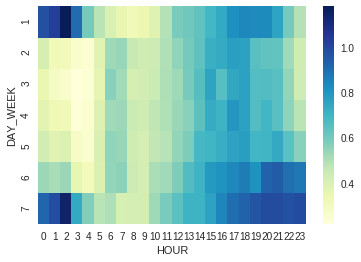

In [10]:
time_frame = pd.DataFrame({'ACCIDENTS': accident.groupby(['HOUR', 'DAY_WEEK'])['FATALS'].count()}).reset_index()
time_frame = time_frame[time_frame['HOUR'] != 99] #remove missing values
total = sum(time_frame['ACCIDENTS']) #calculate total number of accidents
time_frame['ACCIDENTS'] = (time_frame['ACCIDENTS'] / total) * 100 # standardize as percentage of total accidents 
time_frame = time_frame.pivot("DAY_WEEK","HOUR",  "ACCIDENTS")
#time_frame.head()
sns.heatmap(time_frame, cmap="YlGnBu")

plt.savefig('accident_date_time.png')

Fatal crashes involving drunk drivers, peak in the early morning hours of Saturday(7) and Sunday(1)

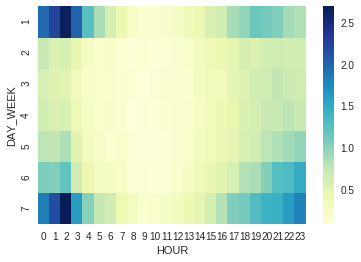

In [11]:
alcohol = accident[accident['DRUNK_DR'] == 1]

time_frame = pd.DataFrame({'ACCIDENTS': alcohol.groupby(['HOUR', 'DAY_WEEK'])['FATALS'].count()}).reset_index()
time_frame = time_frame[time_frame['HOUR'] != 99] #remove missing values
total = sum(time_frame['ACCIDENTS']) #calculate total number of accidents
time_frame['ACCIDENTS'] = (time_frame['ACCIDENTS'] / total) * 100 # standardize as percentage of total accidents 
time_frame = time_frame.pivot("DAY_WEEK","HOUR",  "ACCIDENTS")
#time_frame.head()
sns.heatmap(time_frame, cmap="YlGnBu")

plt.savefig('alcohol_accident_date_time.png')

Fatal crashes involving sober drivers, peak on weekdays around work rush hours, particularly in evening.  Likely because of increased traffic on roads.

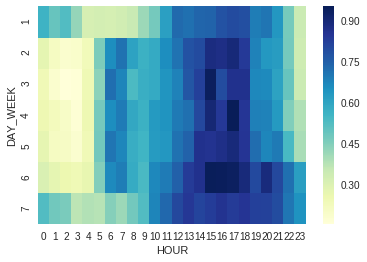

In [12]:
no_alcohol = accident[accident['DRUNK_DR'] == 0]

time_frame = pd.DataFrame({'ACCIDENTS': no_alcohol.groupby(['HOUR', 'DAY_WEEK'])['FATALS'].count()}).reset_index()
time_frame = time_frame[time_frame['HOUR'] != 99] #remove missing values
total = sum(time_frame['ACCIDENTS']) #calculate total number of accidents
time_frame['ACCIDENTS'] = (time_frame['ACCIDENTS'] / total) * 100 # standardize as percentage of total accidents 
time_frame = time_frame.pivot("DAY_WEEK","HOUR",  "ACCIDENTS")
#time_frame.head()
sns.heatmap(time_frame, cmap="YlGnBu")

plt.savefig('nonalcohol_accident_date_time.png')

In [13]:
md= pd.DataFrame.from_csv('month_day_std.csv', index_col=None, encoding = 'utf-8')

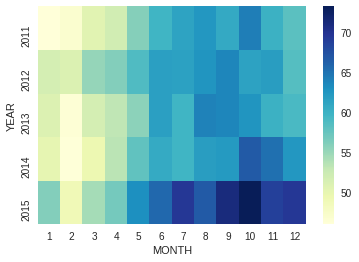

In [14]:
#SCALED FOR NUMBER OF DAYS IN MONTH

time_frame = pd.DataFrame({'ACCIDENTS': no_alcohol.groupby(['YEAR', 'MONTH'])['FATALS'].count()}).reset_index()
year_tot = pd.DataFrame({'TOT_ACCIDENTS': no_alcohol.groupby(['YEAR'])['FATALS'].count()}).reset_index() #calculate total accidents in year
time_frame = time_frame.merge(md, on = ['YEAR','MONTH'], how = 'left') #merge
time_frame['SCALED_ACC'] = time_frame['ACCIDENTS'] / time_frame['NDAY']

#time_frame

time_frame = time_frame.pivot("YEAR","MONTH", "SCALED_ACC")
sns.heatmap(time_frame, cmap="YlGnBu")

plt.savefig('accidents_year.png')

In [15]:
#summarize population by state)
c = census
#filter for year == 8, which is 2015 estimate(most recent and corresponds with accident data)
#and age group 0, which is total
c15 = c[(c['YEAR'] == 2015) & (c['AGEGRP'] == 0)]
pop_state = c15.groupby(c15.STATE)[['TOT_POP']].sum().reset_index()
pop_state.head()
#c15.head()

,STATE,TOT_POP
0,1,4858979
1,2,738432
2,4,6828065
3,5,2978204
4,6,39144818


(array([ 11.,   9.,   7.,   5.,   6.,   5.,   2.,   3.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   1.,   0.,   0.,   1.,   1.]),
 array([   100. ,    854.2,   1608.4,   2362.6,   3116.8,   3871. ,
          4625.2,   5379.4,   6133.6,   6887.8,   7642. ,   8396.2,
          9150.4,   9904.6,  10658.8,  11413. ,  12167.2,  12921.4,
         13675.6,  14429.8,  15184. ]),
 <a list of 20 Patch objects>)

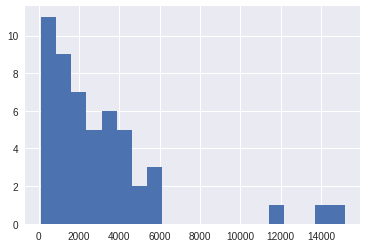

In [16]:
a = accident
acc_state = a.groupby(a.STATE).size().to_frame().reset_index()
acc_state.columns = ['STATE', 'ACC']
#print(acc_state)
plt.hist(acc_state.ACC, normed=False, bins=20)

In [17]:
#combine with accident data 
acc_pop =  pd.merge(acc_state, pop_state, how='left', on=['STATE'])
acc_pop.head()

,STATE,ACC,TOT_POP
0,1,3917,4858979
1,2,294,738432
2,4,3793,6828065
3,5,2381,2978204
4,6,13994,39144818


(array([ 1.,  0.,  3.,  2.,  4.,  4.,  6.,  4.,  3.,  5.,  3.,  2.,  2.,
         1.,  2.,  3.,  2.,  1.,  0.,  3.]),
 array([ 148.75905199,  189.69110691,  230.62316184,  271.55521676,
         312.48727169,  353.41932661,  394.35138154,  435.28343646,
         476.21549139,  517.14754631,  558.07960124,  599.01165616,
         639.94371109,  680.87576601,  721.80782094,  762.73987586,
         803.67193079,  844.60398571,  885.53604063,  926.46809556,
         967.40015048]),
 <a list of 20 Patch objects>)

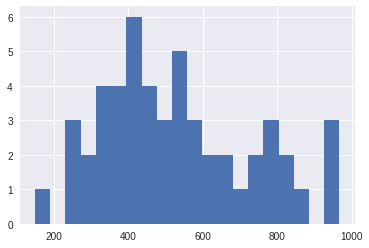

In [18]:
#make population in millions column
acc_pop = acc_pop.assign(POP_MIL = pd.Series(acc_pop.TOT_POP / 1000000).values)
#make accidents per million column
acc_pop = acc_pop.assign(ACC_MIL = pd.Series(acc_pop.ACC / acc_pop.POP_MIL).values)
#print(acc_pop)

plt.hist(acc_pop.ACC_MIL, normed=False, bins=20)

In [19]:
us_states = np.asarray(['AL', 'AK', 'AZ', 'AR', 'CA', 'CO', 'CT', 'DE', 'DC', 'FL', 'GA',
                        'HI', 'ID', 'IL', 'IN', 'IA', 'KS', 'KY', 'LA', 'ME', 'MD', 'MA',
                        'MI', 'MN', 'MS', 'MO', 'MT', 'NE', 'NV', 'NH', 'NJ', 'NM', 'NY',
                        'NC', 'ND', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX',
                        'UT', 'VT', 'VA', 'WA', 'WV', 'WI', 'WY'])

# state proportion of 
state_crashes = np.asarray(acc_pop['ACC_MIL'])

acc_scale = [[0.0, 'rgb(242,240,247)'], [1000, 'rgb(84,39,143)']]

data = [dict(
        type = 'choropleth',
        autocolorscale = False,
        colorscale = acc_scale,
        showscale = True,
        locations = us_states,
        locationmode = 'USA-states',
        z = state_crashes,
        marker = dict(
            line = dict(
                color = 'rgb(255, 255, 255)',
                width = 2)),
        colorbar = dict(
            title = "Crashes per mill")
        )]

layout = dict(
         title = 'Number of fatal crashes per 1 million people (2015)',
         geo = dict(
             scope = 'usa',
             projection = dict(type = 'albers usa'),
             countrycolor = 'rgb(255, 255, 255)',
             showlakes = True,
             lakecolor = 'rgb(255, 255, 255)')
         )

figure = dict(data = data, layout = layout)
iplot(figure)

What percentage of crashes involve alcohol?

In [20]:
alcohol_summary = pd.DataFrame({'ALCH_ACCIDENTS': alcohol.groupby(['STATE'])['FATALS'].count()}).reset_index()

In [21]:
total_summary = pd.DataFrame({'ACCIDENTS': accident.groupby(['STATE'])['FATALS'].count()}).reset_index()

In [40]:
alcohol_combo = pd.merge(alcohol_summary, total_summary, how='left', on=['STATE'])
alcohol_combo['PROP_ALCH'] = alcohol_combo['ALCH_ACCIDENTS'] /alcohol_combo['ACCIDENTS']

Add DUI regulation data

In [58]:
state_codes = pd.DataFrame.from_csv('state_codes.csv', index_col=None)

In [54]:
dui = pd.DataFrame.from_csv('wrangled_data/dui_laws.csv', index_col=None)

In [73]:
alcohol_dui = pd.merge(dui, state_codes, how='left', on=['STATE_LONG'])

In [74]:
alcohol_dui = pd.merge(alcohol_dui, alcohol_combo, how='left', on=['STATE'])

In [94]:
alcohol_dui 

,STATE_LONG,LISCENSE_SUSPENSION,RESTORE_DRIVING_PRIVLEDGES,INTERLOCK_FIRST,INTERLOCK_REPEAT,SUSPEND,INTERLOCK_1ST,STATE,STATE_SHORT,STATENS,ALCH_ACCIDENTS,ACCIDENTS,PROP_ALCH
0,Alabama,yes,no,yes,yes,yes,no,1,AL,1779775,1117,3917,0.285167
1,Alaska,yes,yes,yes,yes,yes,no,2,AK,1785533,98,294,0.333333
2,Arizona,yes,yes,yes,yes,yes,no,4,AZ,1779777,975,3793,0.257052
3,Arkansas,yes,yes,yes,yes,yes,no,5,AR,68085,670,2381,0.281394
4,California,yes,yes,no,yes,yes,no,6,CA,1779778,3826,13994,0.273403
5,Colorado,yes,yes,yes,yes,yes,no,8,CO,1779779,737,2230,0.330493
6,Connecticut,yes,no,yes,yes,yes,no,9,CT,1779780,409,1208,0.338576
7,Delaware,yes,no,yes,yes,yes,no,10,DE,1779781,192,527,0.364326
8,District of Columbia,yes,yes,yes,yes,yes,no,11,DC,1702382,25,100,0.250000
9,Florida,yes,yes,no,yes,yes,no,12,FL,294478,3059,11723,0.260940


convert law columns to yes/no

In [76]:
alcohol_dui['LISCENSE_SUSPENSION'] = np.where(alcohol_dui['LISCENSE_SUSPENSION'] == 'no', 'no', 'yes')


In [82]:
alcohol_dui['RESTORE_DRIVING_PRIVLEDGES'][alcohol_dui['RESTORE_DRIVING_PRIVLEDGES'].str.contains('no') == True] ='no'
alcohol_dui['RESTORE_DRIVING_PRIVLEDGES'] = np.where(alcohol_dui['RESTORE_DRIVING_PRIVLEDGES'] == 'no', 'no', 'yes')

/home/rlrognstad/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [84]:
alcohol_dui['INTERLOCK_FIRST'][alcohol_dui['INTERLOCK_FIRST'].str.contains('all offenders') == True] ='yes'
alcohol_dui['INTERLOCK_FIRST'] = np.where(alcohol_dui['INTERLOCK_FIRST'] == 'yes', 'yes', 'no')

/home/rlrognstad/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [85]:
alcohol_dui['INTERLOCK_REPEAT'][alcohol_dui['INTERLOCK_REPEAT'].str.contains('yes') == True] ='yes'
alcohol_dui['INTERLOCK_REPEAT'] = np.where(alcohol_dui['INTERLOCK_REPEAT'] == 'yes', 'yes', 'no')

/home/rlrognstad/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [89]:
list(alcohol_dui)

['STATE_LONG',
 'LISCENSE_SUSPENSION',
 'RESTORE_DRIVING_PRIVLEDGES',
 'INTERLOCK_FIRST',
 'INTERLOCK_REPEAT',
 'SUSPEND',
 'INTERLOCK_1ST',
 'STATE',
 'STATE_SHORT',
 'STATENS',
 'ALCH_ACCIDENTS',
 'ACCIDENTS',
 'PROP_ALCH']

Do states with stronger DUI laws have a lower frequency of DUI-involved fatal accidents?

In [93]:
liscense_means = alcohol_dui.groupby('LISCENSE_SUSPENSION')['PROP_ALCH'].mean()
liscense_means

LISCENSE_SUSPENSION
no     0.324775
yes    0.303879
Name: PROP_ALCH, dtype: float64

In [95]:
restore_means = alcohol_dui.groupby('RESTORE_DRIVING_PRIVLEDGES')['PROP_ALCH'].mean()
restore_means

RESTORE_DRIVING_PRIVLEDGES
no     0.305356
yes    0.308773
Name: PROP_ALCH, dtype: float64

In [96]:
interlock_first_means = alcohol_dui.groupby('INTERLOCK_FIRST')['PROP_ALCH'].mean()
interlock_first_means

INTERLOCK_FIRST
no     0.308667
yes    0.306796
Name: PROP_ALCH, dtype: float64

In [97]:
interlock_repeat_means = alcohol_dui.groupby('INTERLOCK_REPEAT')['PROP_ALCH'].mean()
interlock_repeat_means

INTERLOCK_REPEAT
no     0.368272
yes    0.302400
Name: PROP_ALCH, dtype: float64

t-tests for significance 

In [117]:
liscense_test = scipy.stats.ttest_ind(alcohol_dui[alcohol_dui['LISCENSE_SUSPENSION'] == 'no']['PROP_ALCH'], alcohol_dui[alcohol_dui['LISCENSE_SUSPENSION'] == 'yes']['PROP_ALCH'])
liscense_test

Ttest_indResult(statistic=1.0820399211294975, pvalue=0.28453117629478814)

In [118]:
restore_test = scipy.stats.ttest_ind(alcohol_dui[alcohol_dui['RESTORE_DRIVING_PRIVLEDGES'] == 'no']['PROP_ALCH'], alcohol_dui[alcohol_dui['RESTORE_DRIVING_PRIVLEDGES'] == 'yes']['PROP_ALCH'])
restore_test

Ttest_indResult(statistic=-0.21929402927553013, pvalue=0.82733195470523246)

In [119]:
interlock_first_test = scipy.stats.ttest_ind(alcohol_dui[alcohol_dui['INTERLOCK_FIRST'] == 'no']['PROP_ALCH'], alcohol_dui[alcohol_dui['INTERLOCK_FIRST'] == 'yes']['PROP_ALCH'])
interlock_first_test

Ttest_indResult(statistic=0.12362160685995402, pvalue=0.90212058956415131)

In [120]:
interlock_repeat_test = scipy.stats.ttest_ind(alcohol_dui[alcohol_dui['INTERLOCK_REPEAT'] == 'no']['PROP_ALCH'], alcohol_dui[alcohol_dui['INTERLOCK_REPEAT'] == 'yes']['PROP_ALCH'])
interlock_repeat_test

Ttest_indResult(statistic=2.5276168781754778, pvalue=0.014759071326985975)

In [23]:
us_states = np.asarray(['AL', 'AK', 'AZ', 'AR', 'CA', 'CO', 'CT', 'DE', 'DC', 'FL', 'GA',
                        'HI', 'ID', 'IL', 'IN', 'IA', 'KS', 'KY', 'LA', 'ME', 'MD', 'MA',
                        'MI', 'MN', 'MS', 'MO', 'MT', 'NE', 'NV', 'NH', 'NJ', 'NM', 'NY',
                        'NC', 'ND', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX',
                        'UT', 'VT', 'VA', 'WA', 'WV', 'WI', 'WY'])

# state proportion of 
state_alcohol = np.asarray(alcohol_combo['PROP_ALCH'])

alch_scale = [[0.0, 'rgb(242,240,247)'], [1.0, 'rgb(84,39,143)']]

data = [dict(
        type = 'choropleth',
        autocolorscale = False,
        colorscale = alch_scale,
        showscale = True,
        locations = us_states,
        locationmode = 'USA-states',
        z = state_alcohol,
        marker = dict(
            line = dict(
                color = 'rgb(255, 255, 255)',
                width = 2)),
        colorbar = dict(
            title = "Proportion of alcohol-related crashes")
        )]

layout = dict(
         title = 'Proportion of alcohol-related fatal crashes',
         geo = dict(
             scope = 'usa',
             projection = dict(type = 'albers usa'),
             countrycolor = 'rgb(255, 255, 255)',
             showlakes = True,
             lakecolor = 'rgb(255, 255, 255)')
         )

figure = dict(data = data, layout = layout)
iplot(figure)

In [38]:
weather = accident[accident['WEATHER'] > 1]
weather = weather[weather['WEATHER'] < 98]

weather_summary = pd.DataFrame({'WEATHER_ACCIDENTS': weather.groupby(['STATE'])['FATALS'].count()}).reset_index()

weather_combo = pd.merge(weather_summary, total_summary, how='left', on=['STATE'])
weather_combo['PROP_WEATHER'] = weather_combo['WEATHER_ACCIDENTS'] /weather_combo['ACCIDENTS']

In [39]:
weather_combo

,STATE,WEATHER_ACCIDENTS,ACCIDENTS,PROP_WEATHER
0,1,1189,3917,0.303549
1,2,139,294,0.472789
2,4,473,3793,0.124703
3,5,313,2381,0.131457
4,6,2221,13994,0.158711
5,8,162,2230,0.072646
6,9,136,1208,0.112583
7,10,159,527,0.301708
8,11,8,100,0.080000
9,12,3083,11723,0.262987


In [83]:
us_states = np.asarray(['AL', 'AK', 'AZ', 'AR', 'CA', 'CO', 'CT', 'DE', 'DC', 'FL', 'GA',
                        'HI', 'ID', 'IL', 'IN', 'IA', 'KS', 'KY', 'LA', 'ME', 'MD', 'MA',
                        'MI', 'MN', 'MS', 'MO', 'MT', 'NE', 'NV', 'NH', 'NJ', 'NM', 'NY',
                        'NC', 'ND', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX',
                        'UT', 'VT', 'VA', 'WA', 'WV', 'WI', 'WY'])

# state proportion of 
state_weather = np.asarray(weather_combo['PROP_WEATHER'])

weather_scale = [[0.0, 'rgb(242,240,247)'], [1.0, 'rgb(84,39,143)']]

data = [dict(
        type = 'choropleth',
        autocolorscale = False,
        colorscale = weather_scale,
        showscale = True,
        locations = us_states,
        locationmode = 'USA-states',
        z = state_weather,
        marker = dict(
            line = dict(
                color = 'rgb(255, 255, 255)',
                width = 2)
            ),
        colorbar = dict(
            title = "Proportion of weather-related crashes")
        )]

layout = dict(
         title = 'Proportion of weather-related fatal crashes',
         geo = dict(
             scope = 'usa',
             projection = dict(type = 'albers usa'),
             countrycolor = 'rgb(255, 255, 255)',
             showlakes = True,
             lakecolor = 'rgb(255, 255, 255)')
         )

figure = dict(data = data, layout = layout)
iplot(figure)

vehicle dataset

In [87]:
vehicle = pd.DataFrame.from_csv('wrangled_data/vehicle_2011_2015.csv', index_col=None)

/home/rlrognstad/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2821: DtypeWarning:

Columns (4,7,25,50,51,75,80,81,95,96,98,111,113) have mixed types. Specify dtype option on import or set low_memory=False.



In [100]:
speeding = vehicle[vehicle['SPEEDREL'] > 1]
speeding = speeding[speeding['SPEEDREL'] < 8]

speeding_summary = pd.DataFrame({'SPEEDING_VEHICLES': speeding.groupby(['STATE'])['DEATHS'].count()}).reset_index()

vehicle_summary = pd.DataFrame({'VEHICLES': vehicle.groupby(['STATE'])['DEATHS'].count()}).reset_index()

speeding_combo = pd.merge(speeding_summary, vehicle_summary, how='left', on=['STATE'])
speeding_combo['PROP_SPEEDING'] = speeding_combo['SPEEDING_VEHICLES'] /speeding_combo['VEHICLES']

In [101]:
us_states = np.asarray(['AL', 'AK', 'AZ', 'AR', 'CA', 'CO', 'CT', 'DE', 'DC', 'FL', 'GA',
                        'HI', 'ID', 'IL', 'IN', 'IA', 'KS', 'KY', 'LA', 'ME', 'MD', 'MA',
                        'MI', 'MN', 'MS', 'MO', 'MT', 'NE', 'NV', 'NH', 'NJ', 'NM', 'NY',
                        'NC', 'ND', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX',
                        'UT', 'VT', 'VA', 'WA', 'WV', 'WI', 'WY'])

# state proportion of 
state_speeding = np.asarray(speeding_combo['PROP_SPEEDING'])

speeding_scale = [[0.0, 'rgb(242,240,247)'], [1.0, 'rgb(84,39,143)']]

data = [dict(
        type = 'choropleth',
        autocolorscale = False,
        colorscale = speeding_scale,
        showscale = True,
        locations = us_states,
        locationmode = 'USA-states',
        z = state_speeding,
        marker = dict(
            line = dict(
                color = 'rgb(255, 255, 255)',
                width = 2)
            ),
        colorbar = dict(
            title = "Prop. speeding")
        )]

layout = dict(
         title = 'Proportion of speeding-related fatal crashes',
         geo = dict(
            
             scope = 'usa',
             projection = dict(type = 'albers usa'),
             countrycolor = 'rgb(255, 255, 255)',
             showlakes = True,
             lakecolor = 'rgb(255, 255, 255)')
         )

figure = dict(data = data, layout = layout)
iplot(figure)

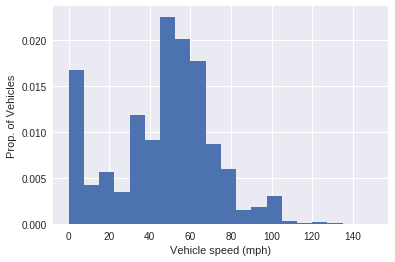

In [106]:
speeding2 = vehicle[vehicle['TRAV_SP'] < 997]
plt.hist(speeding2.TRAV_SP, normed=True, bins=20)
plt.ylabel('Prop. of Vehicles')
plt.xlabel('Vehicle speed (mph)')

plt.savefig('speed_hist.png')